In [1]:
# overlay atypia and nc statistics on slide
# also include normal slide

In [2]:
# ! ls example_full_scans/

In [2]:
# ! ls prelim_out_dir/pos*
# print(f"prelim_out_dir/{os.path.basename(file).replace('.npy','')}.pkl")

prelim_out_dir/pos_9_1_12_R_orig.pkl


In [1]:
import fire

import numpy as np
import PIL
from PIL import Image

import os
import sys
import deepzoom
import time
import shutil
import subprocess
import glob

import os
import time
import subprocess
from multiprocessing import Process

import fire

import numpy as np
import PIL
from PIL import Image

import os
import sys
import deepzoom
import time
import shutil

def worker(png_path, web_dir):
    # disable safety checks for large images
    PIL.Image.MAX_IMAGE_PIXELS = None

    name=os.path.basename(png_path).replace(".png","")

    prefix_path = os.path.join(web_dir, "images", name)
    dzi_path = prefix_path + ".dzi"
    if not os.path.exists(dzi_path):
        print(dzi_path)
        base_html_path = "PairedHE2Tri/npy2dzi.html"
        new_html_path = os.path.join(web_dir, "index.html")

        openseadragon_src = "PairedHE2Tri/openseadragon/"
        openseadragon_dst = os.path.join(web_dir, "openseadragon/")

        title=name

        # create dzi files
        START_TIME = time.time()
        print("Creating .dzi file")
        creator = deepzoom.ImageCreator(
            tile_size=256,
            tile_overlap=0,
            tile_format="png",
            image_quality=1.0,
        )
        creator.create(png_path, dzi_path)
        print("Execution time (s):", time.time() - START_TIME)
        print("Done.\n")

        START_TIME = time.time()
        print("Creating HTML files")
        # create html files
#         with open(base_html_path, "r") as f:
#             HTML_STR = "".join(f.readlines())
#         HTML_STR = HTML_STR.replace("{REPLACE_wsi_prefix}", os.path.join("images", name))
#         HTML_STR = HTML_STR.replace("{REPLACE_title}", title)
#         with open(new_html_path, "w") as f:
#             f.write(HTML_STR)
#         # copy openseadragon
#         if not os.path.isdir(openseadragon_dst):
#             shutil.copytree(openseadragon_src, openseadragon_dst)
#         print("Execution time (s):", time.time() - START_TIME)
#         print("Done.\n")


def png2dzi(image_path,web_dir,basename):
    PROGRAM_START_TIME = time.time()

    jobs = []
    for png_path in glob.glob(f"{image_path}/{basename}*.png"):
        p = Process(target=worker, args=(png_path, web_dir))
        jobs += [p]
        p.start()
    for job in jobs:
        job.join()

# def png2dzi(image_dir, web_dir, basename, shrink_factor=1): # image_dir is where all images are, ordered
#     # disable safety checks for large images
#     PIL.Image.MAX_IMAGE_PIXELS = None

# #     assert(wsi_name[-4:] == ".npy")

# #     wsi_prefix = wsi_name[:-4]

#     openseadragon_src = "PairedHE2Tri/openseadragon/"
#     openseadragon_dst = os.path.join(web_dir, "openseadragon/")

#     for png_path in glob.glob(os.path.join(image_dir,f"{basename}*.png")):
        
#         name=os.path.basename(png_path).replace(".png","")

#         prefix_path = os.path.join(web_dir, "images", name)
#         dzi_path = prefix_path + ".dzi"
#         base_html_path = "PairedHE2Tri/npy2dzi.html"
#         new_html_path = os.path.join(web_dir, "index.html")
        
# #         iter_name = web_dir[web_dir.rindex("/") + 1:]
#         title = name#iter_name + " " + wsi_name

#         # create dzi files
#         START_TIME = time.time()
#         print("Creating .dzi file")
#         creator = deepzoom.ImageCreator(
#             tile_size=256,
#             tile_overlap=0,
#             tile_format="png",
#             image_quality=1.0,
#         )
#         creator.create(png_path, dzi_path)
#         print("Execution time (s):", time.time() - START_TIME)
#         print("Done.\n")

#         START_TIME = time.time()
#         print("Creating HTML files")
#         # create html files
#         with open(base_html_path, "r") as f:
#             HTML_STR = "".join(f.readlines())
#         HTML_STR = HTML_STR.replace("{REPLACE_wsi_prefix}", os.path.join("images", name))
#         HTML_STR = HTML_STR.replace("{REPLACE_title}", title)
#         with open(new_html_path, "w") as f:
#             f.write(HTML_STR)
#     # copy openseadragon
#     if not os.path.isdir(openseadragon_dst):
#         shutil.copytree(openseadragon_src, openseadragon_dst)
#     print("Execution time (s):", time.time() - START_TIME)
#     print("Done.\n")

# if __name__=="__main__":
#     fire.Fire(main)

In [2]:
import pandas as pd, os
from ot import sliced
import glob
import numpy as np
from scipy.special import softmax
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import tqdm
import cv2
from skimage.draw import circle
matplotlib.rcParams['figure.dpi']=300
def edit_stats(stat):
    stats2={}
    include=softmax(stat['uro_decision'],1).argmax(1)==0#[:,0]>0.99#
    stats2['nc_ratio']=(stat['nc'][2]/(stat['nc'][2]+stat['nc'][1]))[include]
    stats2['atypia']=stat['atypia'][include]
    return pd.concat([pd.DataFrame(stats2),stat['cell_stats'].loc[include]],axis=1)
# print(files)


files=glob.glob(f"prelim_out_dir/*.pkl")#{os.path.basename(file).replace('.npy','')}
stats={f:pd.read_pickle(f) for f in files}

#file=files[0]#"example_full_scans/pos_9_1_12_R_orig.npy"
def make_images(file):
    print(file)
    if not os.path.exists(f"webapp_images_dzi/images/{os.path.basename(file).replace('.pkl','_crosstabulation.png')}"):
        arr=np.load(f"example_full_scans/{os.path.basename(file).replace('.pkl','.npy')}")

        stat=edit_stats(stats[file])
        plt.figure()
        plt.scatter(stat['nc_ratio'],stat['atypia'],alpha=0.3,s=2)
        plt.title(file)
        plt.xlabel("NC Ratio")
        plt.ylabel("Atypia")
        sns.despine()
        plt.savefig(f"webapp_images_dzi/images/{os.path.basename(file).replace('.pkl','_crosstabulation.png')}")
        try:
            xy=np.array(stat['centroid'].tolist())
            arr2=arr.copy()
            arr3=arr.copy()
            cmap=sns.color_palette("viridis", as_cmap=True)
            colors=stat['atypia'].map(lambda x: (np.array(cmap(x)[:3])*255).astype(int)).tolist()
            colors2=stat['nc_ratio'].map(lambda x: (np.array(cmap(x)[:3])*255).astype(int)).tolist()

            for i,(x,y) in tqdm.tqdm(list(enumerate(stat['centroid'].tolist()))):
                xx,yy=circle(int(round(x)), int(round(y)), 20)
                arr2[xx,yy]=colors[i]
                arr3[xx,yy]=colors2[i]
            cv2.imwrite(f"webapp_images/{os.path.basename(file).replace('.pkl','')}.png",cv2.cvtColor(cv2.resize(arr,None,fx=1/4.,fy=1/4.,interpolation=cv2.INTER_CUBIC),cv2.COLOR_BGR2RGB))
            cv2.imwrite(f"webapp_images/{os.path.basename(file).replace('.pkl','')}.atypia.png",cv2.cvtColor(cv2.resize(arr2,None,fx=1/4.,fy=1/4.,interpolation=cv2.INTER_CUBIC),cv2.COLOR_BGR2RGB))
            cv2.imwrite(f"webapp_images/{os.path.basename(file).replace('.pkl','')}.nc.png",cv2.cvtColor(cv2.resize(arr3,None,fx=1/4.,fy=1/4.,interpolation=cv2.INTER_CUBIC),cv2.COLOR_BGR2RGB))

            basename=os.path.basename(file).replace('.pkl','')#files=glob.glob(f"webapp_images/{os.path.basename(file).replace('.pkl','')}*")
            png2dzi("webapp_images/", "webapp_images_dzi/", basename)
        except:
            pass
    # for f in files:
    #     basename=os.path.basename(f).replace(".png","")
    #     png2dzi("webapp_images/", "webapp_images_dzi/", basename)


In [4]:
! ls webapp_images_dzi/images/*_crosstabulation.png | xargs -I F basename F _crosstabulation.png | sort

aty_0_12_16_R_orig
aty_0_13_16_R_orig
aty_11_4_15_R_orig
aty_13_6_17_N_orig
aty_16_10_17_R_orig
aty_19_2_13_R_orig
aty_1_12_17_R_orig
aty_25_4_16_R_orig
aty_2_6_15_N_orig
aty_30_6_15_N_orig
aty_31_14_17_N_orig
aty_31_1_12_N_orig
aty_31_2_12_N_orig
aty_31_9_14_N_orig
aty_38_10_18_N_orig
aty_41_10_15_R_orig
aty_41_4_12_R_orig
aty_43_2_13_R_orig
aty_50_0_12_R_orig
aty_50_2_12_R_orig
aty_50_9_17_R_orig
aty_56_11_15_R_orig
aty_57_2_11_R_orig
aty_62_6_16_R_orig
aty_65_16_14_R_orig
aty_65_20_16_R_orig
aty_65_7_11_R_orig
aty_66_4_12_R_orig
aty_66_7_12_R_orig
aty_67_1_09_R_orig
aty_68_11_13_R_orig
aty_68_8_13_R_orig
aty_71_13_16_R_orig
aty_71_4_11_R_orig
aty_73_1_10_R_orig
aty_7_4_14_R_orig
aty_80_3_10_R_orig
aty_81_16_14_R_orig
aty_81_21_16_R_orig
aty_83_19_15_R_orig
aty_83_7_11_R_orig
aty_90_1_09_R_orig
aty_91_13_14_R_orig
aty_96_0_08_R_orig
aty_9_7_15_R_orig
neg_101_9_09_R_orig
neg_135_1_08_R_orig
neg_137_1_08_N_orig
neg_13_0_14_N_orig
neg_14_6_16_N_orig
neg_18_4_14_N_orig
neg_1_3_14_R_orig


prelim_out_dir/neg_63_1_12_R_orig.pkl
prelim_out_dir/aty_50_0_12_R_orig.pkl
prelim_out_dir/neg_90_5_11_R_orig.pkl
prelim_out_dir/sus_102_1_08_R_orig.pkl
prelim_out_dir/aty_0_12_16_R_orig.pkl
prelim_out_dir/aty_31_9_14_N_orig.pkl
prelim_out_dir/neg_137_1_08_N_orig.pkl
prelim_out_dir/sus_17_0_12_R_orig.pkl
prelim_out_dir/neg_83_18_14_R_orig.pkl
prelim_out_dir/neg_80_6_12_R_orig.pkl
prelim_out_dir/aty_0_13_16_R_orig.pkl
prelim_out_dir/aty_73_1_10_R_orig.pkl
prelim_out_dir/neg_75_11_15_N_orig.pkl
prelim_out_dir/aty_83_19_15_R_orig.pkl
prelim_out_dir/neg_37_15_18_R_orig.pkl
prelim_out_dir/neg_51_2_11_R_orig.pkl
prelim_out_dir/neg_4_1_13_N_orig.pkl
prelim_out_dir/neg_60_8_14_R_orig.pkl
prelim_out_dir/neg_56_7_13_R_orig.pkl
prelim_out_dir/neg_45_5_13_N_orig.pkl
prelim_out_dir/sus_49_7_13_R_orig.pkl
prelim_out_dir/aty_30_6_15_N_orig.pkl
prelim_out_dir/neg_1_8_15_R_orig.pkl
prelim_out_dir/neg_75_9_13_N_orig.pkl
prelim_out_dir/aty_68_8_13_R_orig.pkl
prelim_out_dir/neg_83_10_12_R_orig.pkl
prelim_

100%|██████████| 803/803 [00:00<00:00, 6148.58it/s]


webapp_images_dzi/images/neg_75_4_11_N_orig.nc.dzi
Creating .dzi file
webapp_images_dzi/images/neg_75_4_11_N_orig.dzi
Creating .dzi file
webapp_images_dzi/images/neg_75_4_11_N_orig.atypia.dzi
Creating .dzi file
Execution time (s): 170.94024682044983
Done.

Creating HTML files
Execution time (s): 172.31926918029785
Done.

Creating HTML files
Execution time (s): 175.86409997940063
Done.

Creating HTML files
prelim_out_dir/neg_71_5_11_R_orig.pkl


100%|██████████| 103/103 [00:00<00:00, 6196.32it/s]


webapp_images_dzi/images/neg_71_5_11_R_orig.atypia.dzi
Creating .dzi file
webapp_images_dzi/images/neg_71_5_11_R_orig.nc.dzi
Creating .dzi file
webapp_images_dzi/images/neg_71_5_11_R_orig.dzi
Creating .dzi file
Execution time (s): 161.30611038208008
Done.

Creating HTML files
Execution time (s): 162.84718561172485
Done.

Creating HTML files
Execution time (s): 162.96971654891968
Done.

Creating HTML files
prelim_out_dir/aty_65_16_14_R_orig.pkl


 28%|██▊       | 3871/13688 [00:00<00:01, 6709.10it/s]


prelim_out_dir/neg_83_9_12_R_orig.pkl


100%|██████████| 3456/3456 [00:00<00:00, 6639.90it/s]


webapp_images_dzi/images/neg_83_9_12_R_orig.dzi
Creating .dzi file
webapp_images_dzi/images/neg_83_9_12_R_orig.nc.dzi
Creating .dzi file
webapp_images_dzi/images/neg_83_9_12_R_orig.atypia.dzi
Creating .dzi file
Execution time (s): 131.84286069869995
Done.

Creating HTML files
Execution time (s): 133.07881712913513
Done.

Creating HTML files
Execution time (s): 133.04315042495728
Done.

Creating HTML files
prelim_out_dir/neg_13_0_14_N_orig.pkl


100%|██████████| 2514/2514 [00:00<00:00, 6966.65it/s]


webapp_images_dzi/images/neg_13_0_14_N_orig.atypia.dzi
Creating .dzi file
webapp_images_dzi/images/neg_13_0_14_N_orig.dzi
Creating .dzi file
webapp_images_dzi/images/neg_13_0_14_N_orig.nc.dzi
Creating .dzi file
Execution time (s): 136.93507146835327
Done.

Creating HTML files
Execution time (s): 138.57711362838745
Done.

Creating HTML files
Execution time (s): 140.59407448768616
Done.

Creating HTML files
prelim_out_dir/neg_38_9_17_N_orig.pkl


100%|██████████| 2514/2514 [00:00<00:00, 5795.26it/s]


webapp_images_dzi/images/neg_38_9_17_N_orig.atypia.dzi
Creating .dzi file
webapp_images_dzi/images/neg_38_9_17_N_orig.nc.dzi
Creating .dzi file
webapp_images_dzi/images/neg_38_9_17_N_orig.dzi
Creating .dzi file
Execution time (s): 139.1497287750244
Done.

Creating HTML files
Execution time (s): 139.39817428588867
Done.

Creating HTML files
Execution time (s): 140.34621810913086
Done.

Creating HTML files
prelim_out_dir/neg_1_3_14_R_orig.pkl


100%|██████████| 13265/13265 [00:01<00:00, 6979.60it/s]


webapp_images_dzi/images/neg_1_3_14_R_orig.dzi
Creating .dzi file
webapp_images_dzi/images/neg_1_3_14_R_orig.nc.dzi
Creating .dzi file
webapp_images_dzi/images/neg_1_3_14_R_orig.atypia.dzi
Creating .dzi file
Execution time (s): 124.72846722602844
Done.

Creating HTML files
Execution time (s): 125.8301932811737
Done.

Creating HTML files
Execution time (s): 128.30510330200195
Done.

Creating HTML files
prelim_out_dir/aty_62_6_16_R_orig.pkl


 25%|██▌       | 751/2959 [00:00<00:00, 6551.19it/s]


prelim_out_dir/sus_90_11_19_R_orig.pkl


 68%|██████▊   | 2183/3210 [00:00<00:00, 6361.98it/s]


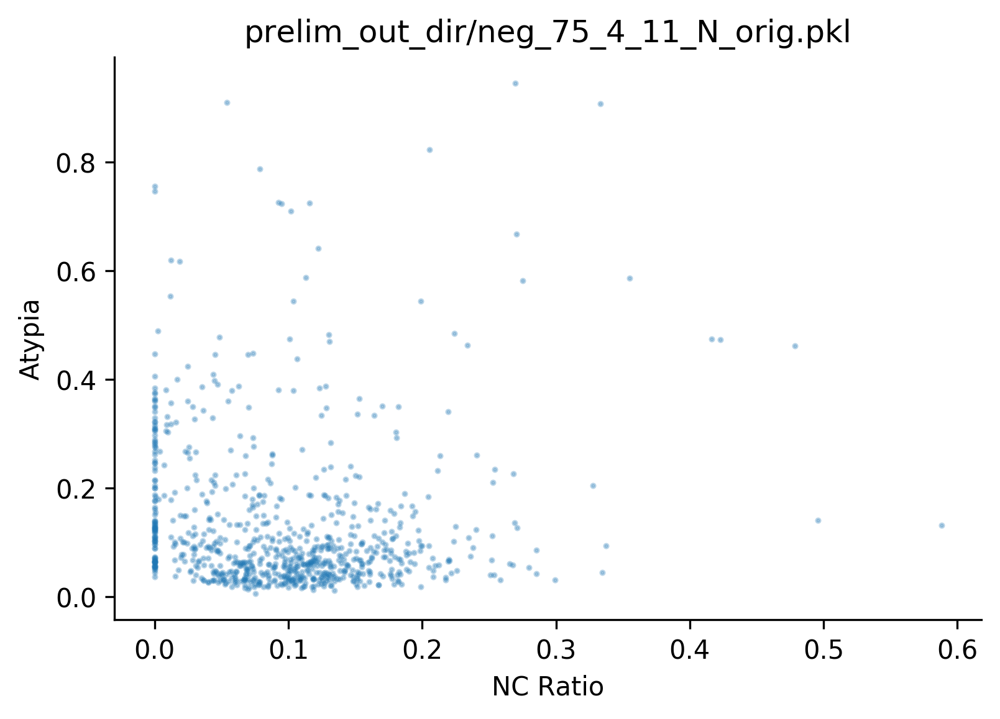

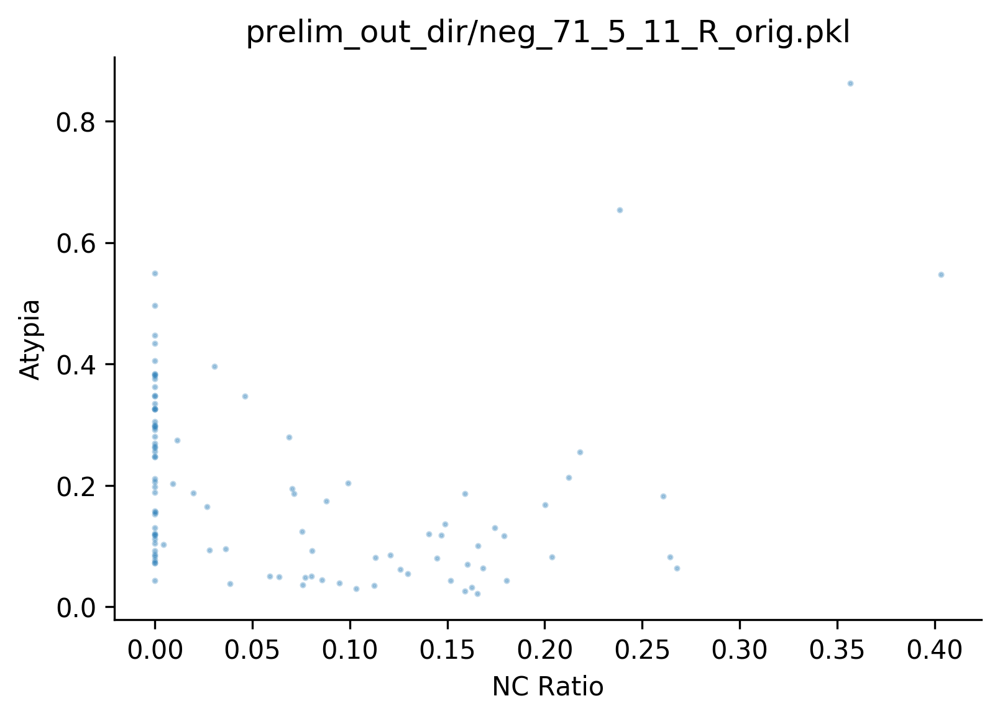

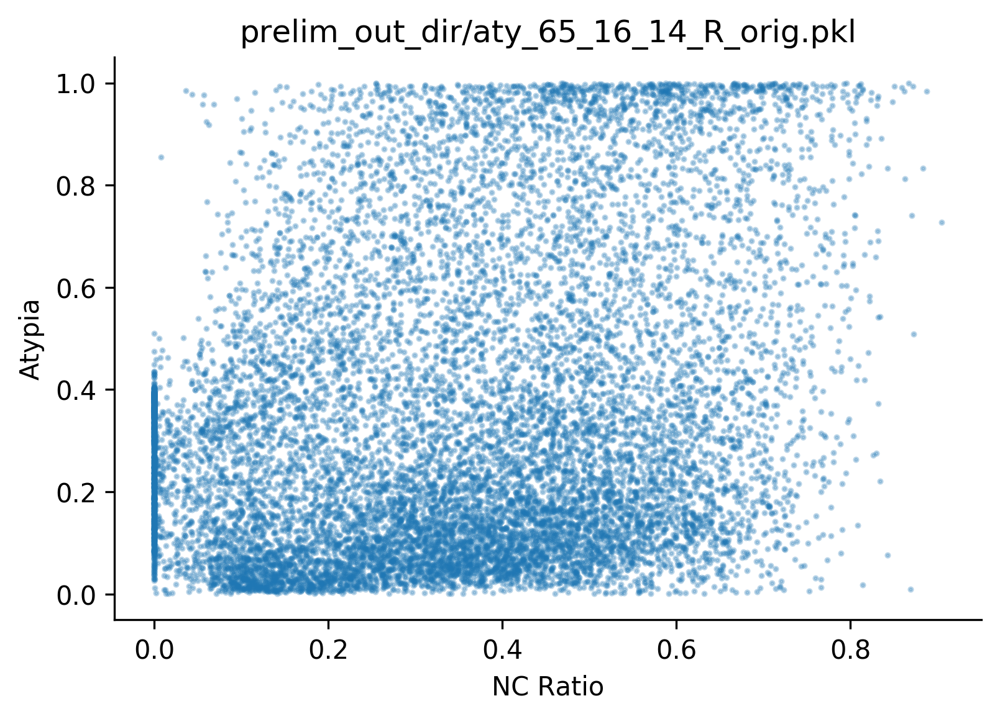

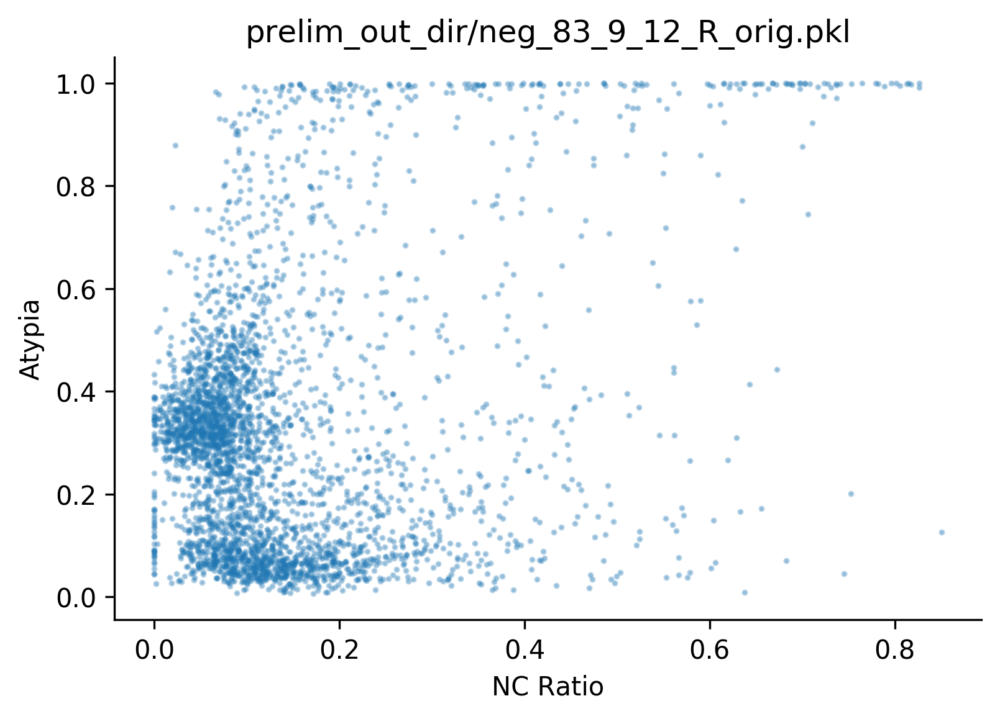

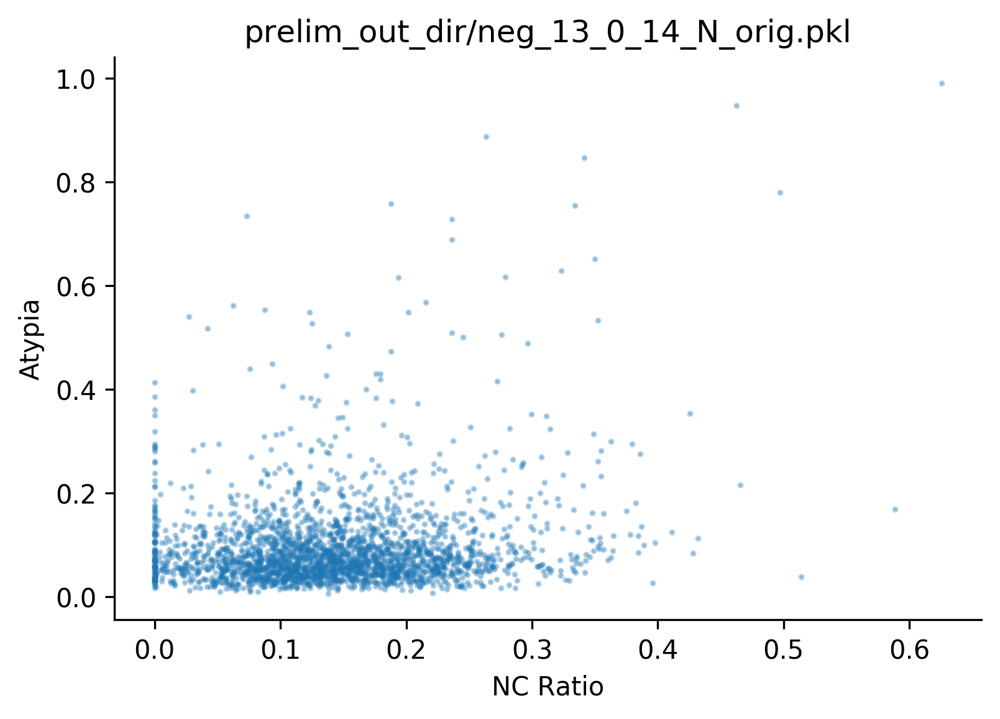

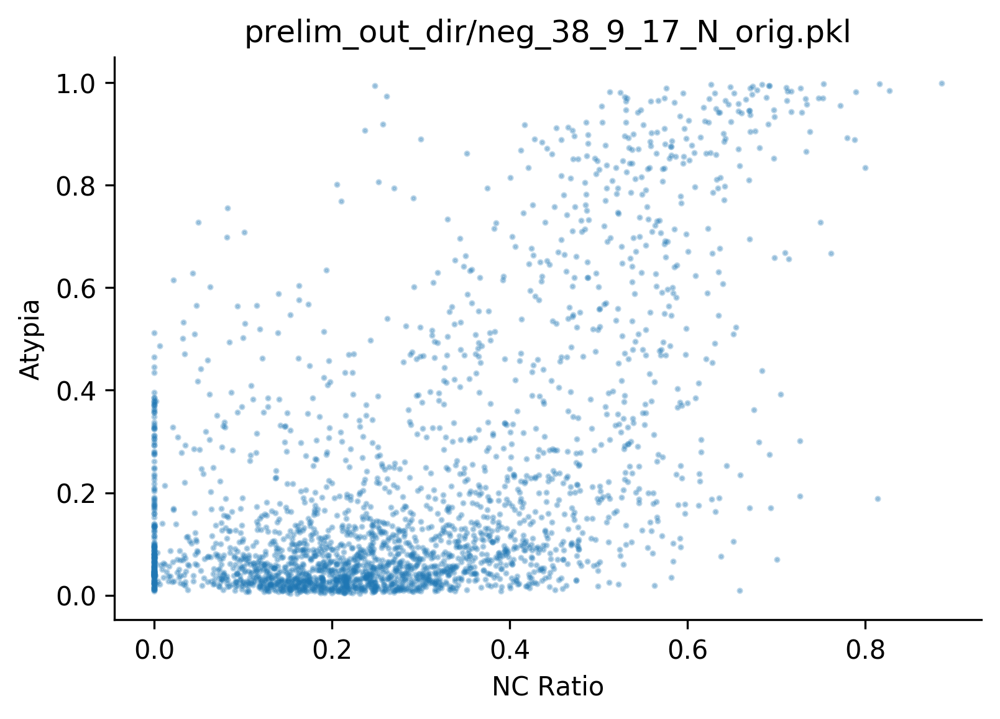

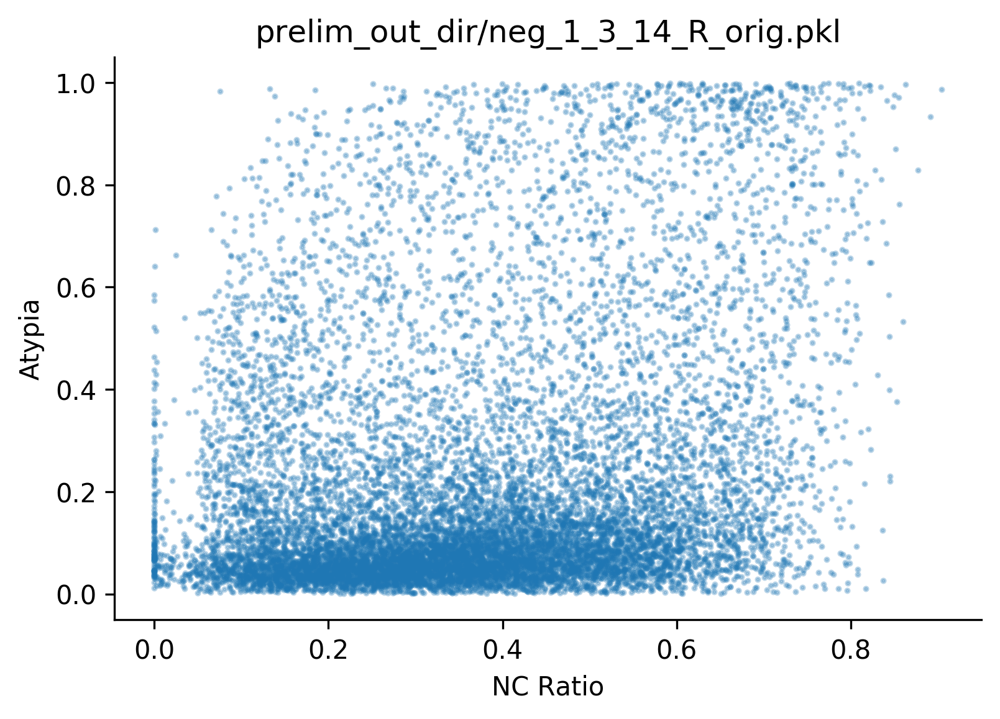

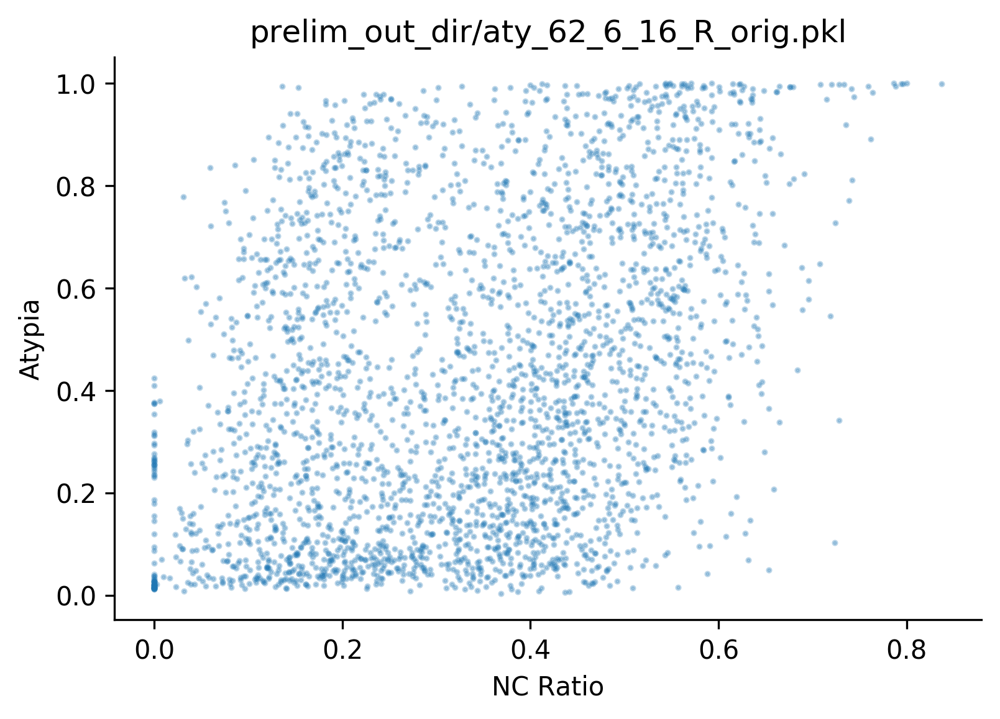

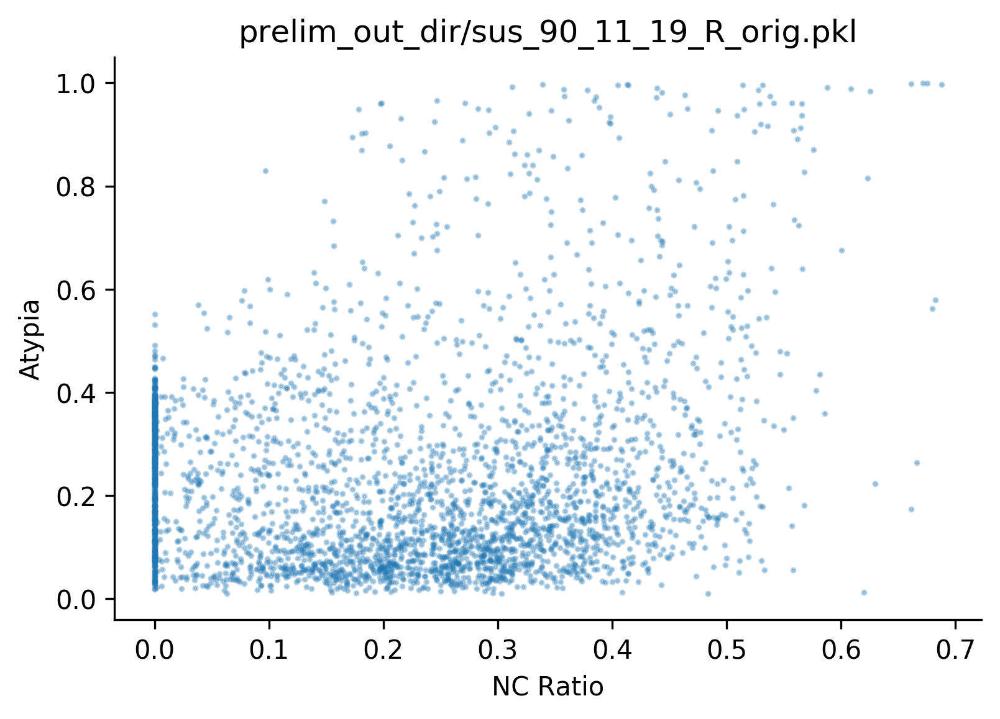

In [8]:
for file in files:
    make_images(file)

In [15]:
# ! ls # ! mkdir old && mv *torque* old/

0_run.sh			    checkpoints_class1	orig_test_set_matlab
1_data_assemble.ipynb		    checkpoints_class2	out_dir
1_run.sh			    checkpoints_class3	predictions_class1.pkl
2_train_model.ipynb		    checkpoints_class4	predictions_class2.pkl
3_new_dataset_do_over.ipynb	    class1.out		predictions_class3.pkl
4_calibration_curve.ipynb	    class2.out		predictions_class4.pkl
5_WSI_RIM_Tabulation.ipynb	    class3.out		prelim_out_dir
5_WSI_RIM_Tabulation.py		    class4.out		prelim_out_dir_old
6_investigate_atypia_slides.ipynb   example_full_scans	prelim_out_dir_old2
7_sanity_check_matlab.ipynb	    images		segmentation_practice
8_sanity_check_slide_overlay.ipynb  inputs		tmp_test.pkl
HE2Tri				    nohup.out		webapp_images
PathPretrain			    old			webapp_images_dzi
checkpoints			    orig_pngs.zip


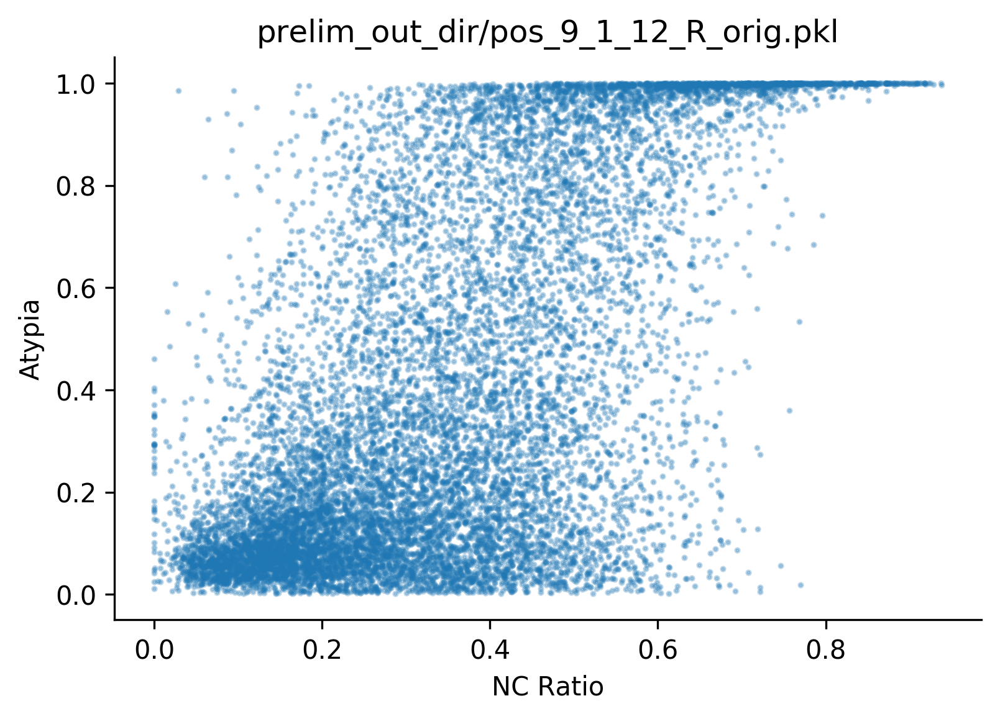

In [44]:


# plt.imshow(arr)

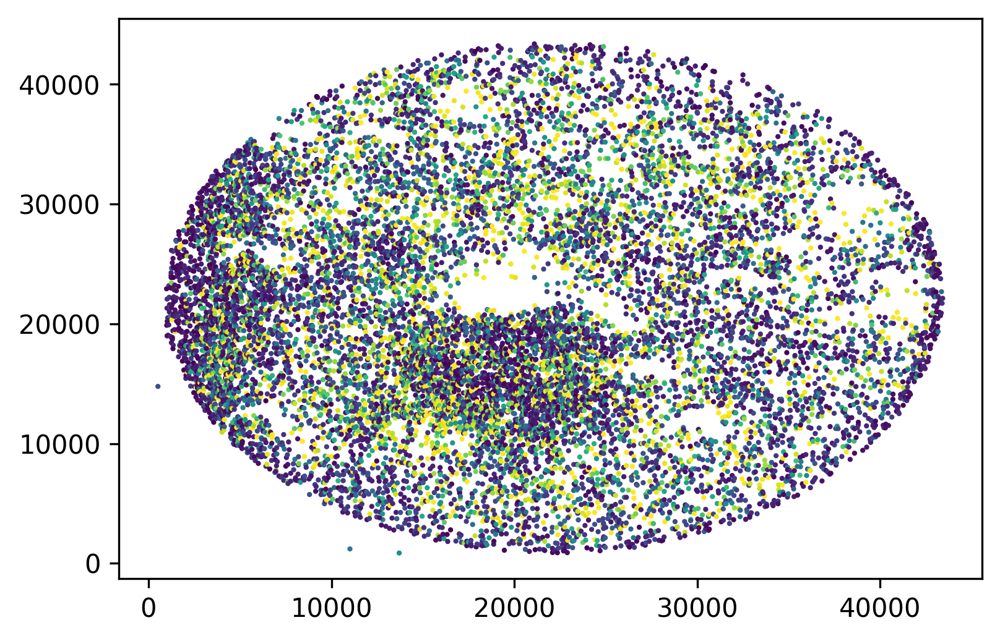

In [34]:
plt.scatter(*xy.T.tolist(),s=1,c=stat['atypia'])

  0%|          | 0/13170 [00:00<?, ?it/s]/home/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: `draw.circle` is deprecated in favor of `draw.disk`.`draw.circle` will be removed in version 0.19
  This is separate from the ipykernel package so we can avoid doing imports until
100%|██████████| 13170/13170 [00:01<00:00, 7834.69it/s]


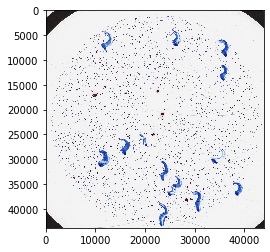

In [22]:
# plt.imshow(arr2)

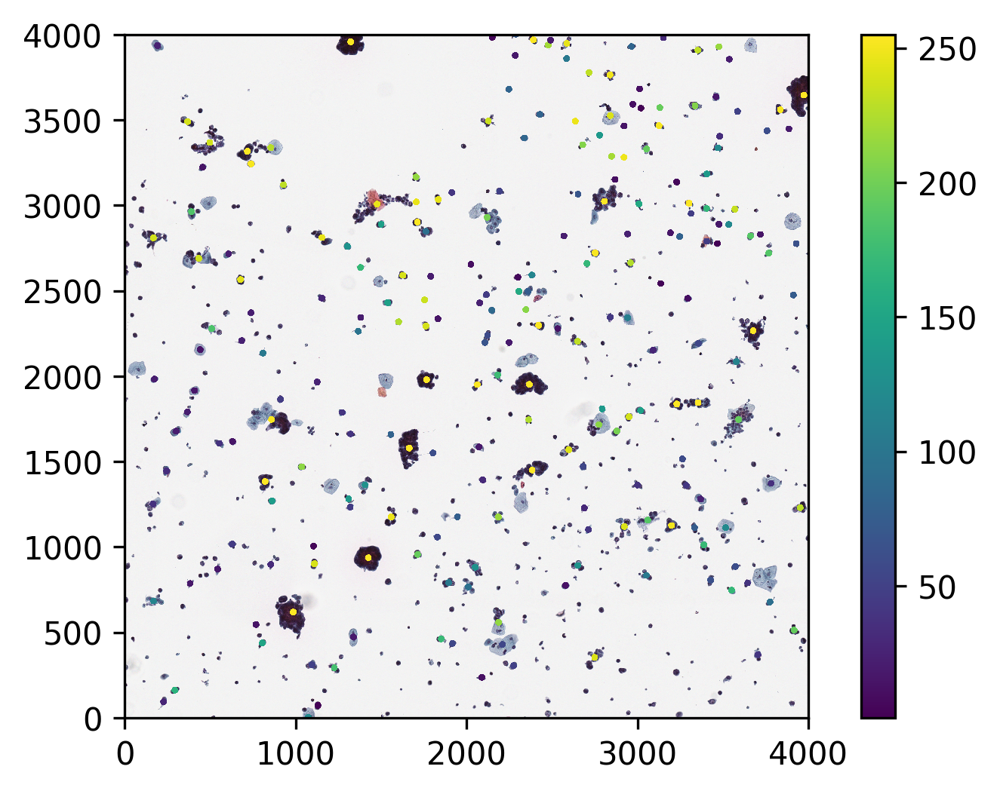

In [29]:
# import matplotlib
# matplotlib.rcParams['figure.dpi']=300
# plt.imshow(arr2[10000:14000,10000:14000])
# plt.xlim([0,4000])
# plt.ylim([0,4000])
# plt.colorbar()

In [30]:
# ! mkdir webapp_images

True

In [74]:
# np.save("webapp_images/1.npy",cv2.resize(arr,None,fx=1/4.,fy=1/4.,interpolation=cv2.INTER_CUBIC))
# np.save("webapp_images/1.atypia.npy",cv2.resize(arr2,None,fx=1/4.,fy=1/4.,interpolation=cv2.INTER_CUBIC))


In [72]:
# import deepzoom

In [16]:
# creator = deepzoom.ImageCreator(
#     tile_size=512,
#     tile_overlap=2,
#     tile_format="png",
#     image_quality=0.8,
#     resize_filter="bicubic",
# )

# # Create Deep Zoom image pyramid from source
# creator.create("webapp_images/1.png", "webapp_images_dzi/images/1.dzi")
# creator.create("webapp_images/1.atypia.png", "webapp_images_dzi/images/1.atypia.dzi")

In [45]:
# import glob,os
# import numpy as np
# import tifffile
# import subprocess
# import fire
# import cv2

# REPLACE_STR="""<html>
# <div id="openseadragon1" style="width: 100%; height: 100%";></div>
# <script src="/openseadragon/openseadragon.js"></script>
# <script type="text/javascript">
#     var viewer = OpenSeadragon({
#         id: "openseadragon1",
#         prefixUrl: "/openseadragon/images/",
#         tileSources: "/REPLACE.dzi",
#         sequenceMode: false,
#         autoHideControls: true,
#         animationTime: 1.0,
#         blendTime: 0.6,
#         constrainDuringPan: true,
#         maxZoomPixelRatio: 1,
#         visibilityRatio: 1,
#         zoomPerScrolli: 1,
#         defaultZoomLevel: 1,
#         showReferenceStrip: true,
#         showNavigator:  true,
# 	    showFullPageControl: false
#     });
# </script>
# </html>
# """
# def main(npy="",out_dir='',compression_factor=1.):#/media/joshualevy/Elements1/final_vTrichrome_cGAN/
#     print(npy)
#     os.makedirs(out_dir,exist_ok=True)
#     tif_dir=os.path.join(out_dir,"tiff_files")
#     os.makedirs(tif_dir,exist_ok=True)
#     out_file=os.path.join(tif_dir,os.path.basename(npy.replace('.npy','.tif').replace('.png','.tif')))
#     out_dzi=os.path.join(out_dir,".",os.path.basename(out_file).replace('.tif',''))#dzi_files
#     os.makedirs(os.path.dirname(out_dzi),exist_ok=True)
#     out_html=os.path.join(out_dir,os.path.basename(out_file).replace('.tif','.html'))
#     if not os.path.exists(out_file):
#         img=(np.load(npy) if npy.endswith('.npy') else cv2.cvtColor(cv2.imread(npy),cv2.COLOR_BGR2RGB))
#         if compression_factor>1.:
#             img=cv2.resize(img,None,fx=1./compression_factor,fy=1./compression_factor,interpolation=cv2.INTER_CUBIC)
#         tifffile.imwrite(out_file,img, photometric='rgb')
#     if not os.path.exists(out_file+'f') and not os.path.exists(out_dzi+'.dzi'):
#         subprocess.call("vips tiffsave --compression=lzw --Q=100 --tile --tile-width=512 --tile-height=512 --pyramid --vips-progress {0} {1}".format(out_file,out_file+'f'),shell=True)
#     if not os.path.exists(out_dzi+'.dzi'):
#         subprocess.call("vips dzsave --tile-size 512 --vips-progress {0} {1} ".format(out_file+'f',out_dzi),shell=True)
# #     if not os.path.exists(out_html):
# #         html_text=REPLACE_STR.replace("REPLACE",os.path.basename(out_dzi))
# #         with open(out_html,'w') as f:
# #             f.write(html_text)

In [78]:
# ! mv webapp_images_dzi/images/*.dzi webapp_images_dzi/images/*files webapp_images_dzi/old/



In [79]:
# ! ls webapp_images_dzi

images	index.html  old  openseadragon	style.css


In [11]:
# import glob
# files=sorted(glob.glob(f"webapp_images/*.png"),key=lambda x: x[-5])
# # if False:
# for f in files:
#     basename=os.path.basename(f).replace(".png","")
#     png2dzi("webapp_images/", "webapp_images_dzi/", basename)

In [12]:
! ls -lah webapp_images_dzi/images/

total 37M
drwxrwx--- 112 f003k8w rc-VaickusL_slow-admin  12K Nov 19 19:22 .
drwxrwx---   5 f003k8w rc-VaickusL_slow-admin  131 Nov 16 20:27 ..
-rwxrwx---   1 f003k8w rc-VaickusL_slow-admin  180 Nov 16 20:45 1.atypia.dzi
drwxrwx---  17 f003k8w rc-VaickusL_slow-admin  290 Nov 16 20:44 1.atypia_files
-rwxrwx---   1 f003k8w rc-VaickusL_slow-admin  180 Nov 16 20:45 1.dzi
drwxrwx---  17 f003k8w rc-VaickusL_slow-admin  290 Nov 16 20:44 1_files
-rwxrwx---   1 f003k8w rc-VaickusL_slow-admin 472K Nov 19 17:37 aty_0_12_16_R_orig_crosstabulation.png
-rwxrwx---   1 f003k8w rc-VaickusL_slow-admin  180 Nov 19 17:54 aty_0_13_16_R_orig.atypia.dzi
drwxrwx---  17 f003k8w rc-VaickusL_slow-admin  290 Nov 19 17:53 aty_0_13_16_R_orig.atypia_files
-rwxrwx---   1 f003k8w rc-VaickusL_slow-admin  180 Nov 19 17:54 aty_0_13_16_R_orig.dzi
-rwxrwx---   1 f003k8w rc-VaickusL_slow-admin  180 Nov 19 17:54 aty_0_13_16_R_orig.nc.dzi
drwxrwx---  17 f003k8w rc-VaickusL_slow-admin  290 Nov 19 17:53 aty_0_13_16_R_orig.nc_fil

In [3]:
replace_txt='","'.join(map(lambda x: f"images/{os.path.basename(x)}",sorted(glob.glob(f"webapp_images_dzi/images/*.dzi"),key=lambda x: x.replace(".dzi","").replace(".png",""))))
# +glob.glob(f"webapp_images_dzi/images/*.png")
# 


In [4]:
replace_txt

'images/1.dzi","images/1.atypia.dzi","images/aty_0_13_16_R_orig.dzi","images/aty_0_13_16_R_orig.atypia.dzi","images/aty_0_13_16_R_orig.nc.dzi","images/aty_103_28_17_R_orig.dzi","images/aty_103_28_17_R_orig.atypia.dzi","images/aty_103_28_17_R_orig.nc.dzi","images/aty_11_4_15_R_orig.dzi","images/aty_11_4_15_R_orig.atypia.dzi","images/aty_11_4_15_R_orig.nc.dzi","images/aty_12_5_13_R_orig.dzi","images/aty_12_5_13_R_orig.atypia.dzi","images/aty_12_5_13_R_orig.nc.dzi","images/aty_13_6_17_N_orig.dzi","images/aty_13_6_17_N_orig.atypia.dzi","images/aty_13_6_17_N_orig.nc.dzi","images/aty_16_10_17_R_orig.dzi","images/aty_16_10_17_R_orig.atypia.dzi","images/aty_16_10_17_R_orig.nc.dzi","images/aty_19_2_13_R_orig.dzi","images/aty_19_2_13_R_orig.atypia.dzi","images/aty_19_2_13_R_orig.nc.dzi","images/aty_1_12_17_R_orig.dzi","images/aty_1_12_17_R_orig.atypia.dzi","images/aty_1_12_17_R_orig.nc.dzi","images/aty_25_4_16_R_orig.dzi","images/aty_25_4_16_R_orig.atypia.dzi","images/aty_25_4_16_R_orig.nc.dzi",

In [4]:
# ! rm webapp_images_dzi/images/*.png
# https://gist.github.com/NoUsername/9308327

In [5]:
"""<img id="viewer" src="" width="800px"/>
    <div id="info"> </div>
<script>
$(function() {

    var baseUrl = "/images/";
    var pictureIndex = 0;
    var pictures = [];

    function getFiles() {
        $.ajax(baseUrl).success(function(data) {
            pictures = [];
            $(data).find("a[href]").each(function() {
                var href = $(this).attr('href');
                if (href.indexOf('.jpg') > 0 || href.indexOf('.png') > 0 || href.indexOf('.jpeg') > 0) {
                    pictures.push(href);
                }
            });
            console.log(pictures.length + " pictures loaded!");
            changePicture(0);
        });
    }

    function changePicture(indexOffset) {
        pictureIndex += indexOffset;
        if (pictureIndex >= pictures.length) {
            pictureIndex = 0;
        } else if (pictureIndex < 0) {
            pictureIndex = pictures.length - 1;
        }
        $('#viewer').attr('src', baseUrl + pictures[pictureIndex]);
        $('#info').text((pictureIndex + 1) + "/" + pictures.length);
    }

    getFiles();
    $(document).keydown(function(e){
        var left = -1, right = 1;
        if (e.keyCode == 37) {
           changePicture(left); return false;
        } else if (e.keyCode == 39) {
            changePicture(right); return false;
        }
    });
});
</script>"""
txt='''<html>
<head>
    <link rel="stylesheet" href="style.css">
    <title id="title">BASENAME</title>
    <script src="http://code.jquery.com/jquery-1.11.0.min.js"></script>

</head>
<body>








    <div class="float-container">
        <div>
            <span>Modes</span>
            <button id="curtainButton">Curtain</button>
            <button id="syncButton">Sync</button>
        </div>
        Image 1: &nbsp <select id="tileSourceSelect1"></select> <br>
        Image 2: <select id="tileSourceSelect2"></select> <br>
        <div class="float-child float-left">
            <span class="image-title" id="leftImageText"></span> <br>
        </div>
        <div class="float-child float-right">
            <span class="image-title" id="rightImageText"></span> <br>
        </div>
    </div>
    <div class="openseadragon" id="viewer"></div>
    <script src="scripts.js"></script>
    <script src="/openseadragon/openseadragon.min.js"></script>
    <script src="/openseadragon/openseadragon-curtain-sync.min.js"></script>
    <script type="text/javascript">

        var imagePrefix = 0;

        var allTileSources = ["REPLACE"];
        
        console.log(allTileSources);
        document.getElementById("title").innerHTML = "BASENAME";

        var viewerImages = [];
        for (var i = 0; i < allTileSources.length; i++) {
            if (allTileSources[i].endsWith("dzi")){
                viewerImages.push({
                    key: allTileSources[i],
                    tileSource: allTileSources[i],
                });
            } else {
                viewerImages.push({
                        type: "image",
                        url: allTileSources[i],
                    });
            }
            
        }
        console.log(viewerImages)
        // create viewers
        var viewer = new CurtainSyncViewer({
            mode: 'sync',
            container: document.getElementById("viewer"),
            images: viewerImages,
        });

        var curtainButton = document.getElementById("curtainButton");
        var syncButton = document.getElementById("syncButton");
        curtainButton.onclick = function() {
            viewer.setMode("curtain");
        };
        syncButton.onclick = function() {
            viewer.setMode("sync");
        };



        // setup drop-down menus
        var tileSourceSelect1 = document.getElementById("tileSourceSelect1");
        var tileSourceSelect2 = document.getElementById("tileSourceSelect2");
        for (var i = 0; i < allTileSources.length; i++) {
            tileSourceSelect1.appendChild(new Option(allTileSources[i], allTileSources[i]));
            tileSourceSelect2.appendChild(new Option(allTileSources[i], allTileSources[i]));
        }

        // default images shown
        var image1 = allTileSources[0];
        var image2 = allTileSources[1];
        viewer.setImageShown(image1, true)
        viewer.setImageShown(image2, true)
        tileSourceSelect1.value = image1;
        tileSourceSelect2.value = image2;
        var leftImageText = document.getElementById("leftImageText");
        var rightImageText = document.getElementById("rightImageText");
        leftImageText.innerHTML = image1;
        rightImageText.innerHTML = image2;

        function setImageOrderText() {
            if (allTileSources.indexOf(image1) < allTileSources.indexOf(image2)) {
                leftImageText.innerHTML = image1;
                rightImageText.innerHTML = image2;
            } else {
                leftImageText.innerHTML = image2;
                rightImageText.innerHTML = image1;
            }
        }

        // setup dropdown menu actions
        tileSourceSelect1.onchange = function(a) {
            console.log("Left image:", this.value);
            if (this.value != image1 && this.value != image2) {
                var curZoom = viewer.getZoom();

                viewer.setImageShown(image1, false);
                image1 = this.value;
                viewer.setImageShown(image1, true);
                setTimeout(function() {
                    viewer.setZoom(curZoom);
                }, 100);

                setImageOrderText();
            } else {
                console.log("EXCEPTION: Selected image is already displayed.");
            }
        }
        tileSourceSelect2.onchange = function(a) {
            console.log("Image:", this.value);
            if (this.value != image1 && this.value != image2) {
                var curZoom = viewer.getZoom();

                viewer.setImageShown(image2, false);
                image2 = this.value;
                viewer.setImageShown(image2, true);
                setTimeout(function() {
                    viewer.setZoom(curZoom);
                }, 100);

                setImageOrderText();
            } else {
                console.log("EXCEPTION: Selected image is already displayed.");
            }
        }

    </script>
</body>
</html>'''.replace("REPLACE",replace_txt).replace("BASENAME","test")

In [6]:
# print(txt)

In [7]:
with open('webapp_images_dzi/index.html','w') as f:
    f.write(txt)

In [35]:
! ls webapp_images_dzi/images

1.atypia.dzi  1.atypia_files  1.dzi  1_files


In [ ]:
! 

In [18]:
stat

,nc_ratio,atypia,area,bbox,bbox_area,centroid,convex_area,eccentricity,equivalent_diameter,euler_number,extent,feret_diameter_max,filled_area,label,major_axis_length,minor_axis_length,orientation,perimeter,perimeter_crofton,solidity
28,0.641282,0.252853,468,"(504, 14755, 532, 14791)",1008,"(517.1709401709402, 14772.027777777777)",544,0.866778,24.410574,1,0.464286,38.275318,468,29,36.738279,18.321166,-1.020917,111.053824,107.967144,0.860294
74,0.335389,0.016224,1733,"(970, 22902, 1015, 22952)",2250,"(991.1431044431622, 22926.607616849393)",1781,0.540703,46.973654,1,0.770222,52.554733,1733,75,51.338221,43.186399,-1.197204,157.195959,151.712632,0.973049
75,0.150376,0.032034,2422,"(972, 19848, 1029, 19902)",3078,"(999.1209744013212, 19875.737819983486)",2470,0.469767,55.531848,1,0.786875,59.908263,2422,76,59.228805,52.286627,0.438302,183.438600,176.592215,0.980567
78,0.278252,0.074730,2151,"(986, 21278, 1039, 21339)",3233,"(1014.1083217108321, 21308.548117154813)",2318,0.770695,52.332956,1,0.665326,65.734314,2151,79,67.275875,42.868471,-1.066054,196.166522,188.659042,0.927955
80,0.076698,0.139082,1843,"(991, 22032, 1053, 22100)",4216,"(1019.2637004883343, 22065.775366250677)",2122,0.932186,48.441516,1,0.437144,80.919713,1843,81,84.376704,30.542742,0.908038,239.764502,231.563315,0.868520
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52160,0.517909,0.148983,1200,"(43287, 23741, 43326, 23790)",1911,"(43304.988333333335, 23764.950833333332)",1343,0.845295,39.088201,1,0.627943,55.226805,1200,52162,54.647661,29.198269,1.107508,160.681241,155.409585,0.893522
52164,0.369965,0.088853,1843,"(43314, 20865, 43363, 20925)",2940,"(43339.17742810635, 20896.497015735215)",1993,0.814064,48.441516,1,0.626871,64.404969,1843,52166,64.484083,37.450770,-1.025072,189.716775,185.422165,0.924737
52168,0.296475,0.338210,1464,"(43326, 22661, 43383, 22706)",2565,"(43352.06010928962, 22683.273907103827)",1785,0.876104,43.174329,1,0.570760,62.769419,1464,52170,66.056715,31.847413,-0.510311,222.515765,218.806375,0.820168
52171,0.011281,0.137381,1276,"(43363, 21692, 43416, 21746)",2862,"(43387.49921630094, 21716.095611285265)",1782,0.875006,40.306993,1,0.445842,62.968246,1276,52173,64.900544,31.419083,0.729191,235.279221,232.674036,0.716049


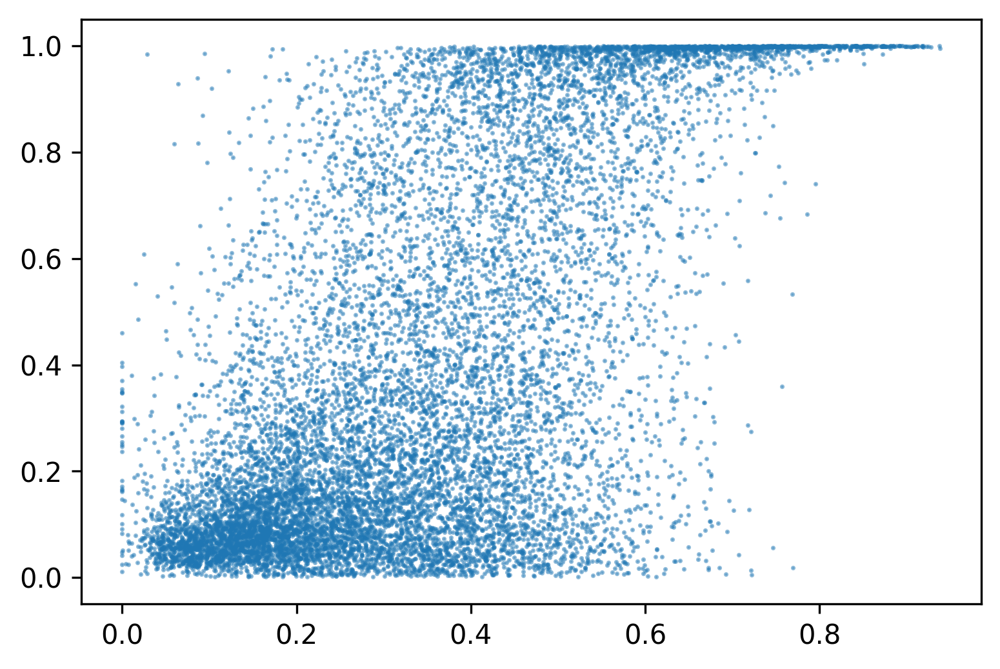

In [42]:
plt.scatter(stat['nc_ratio'],stat['atypia'],s=0.5,alpha=0.5)

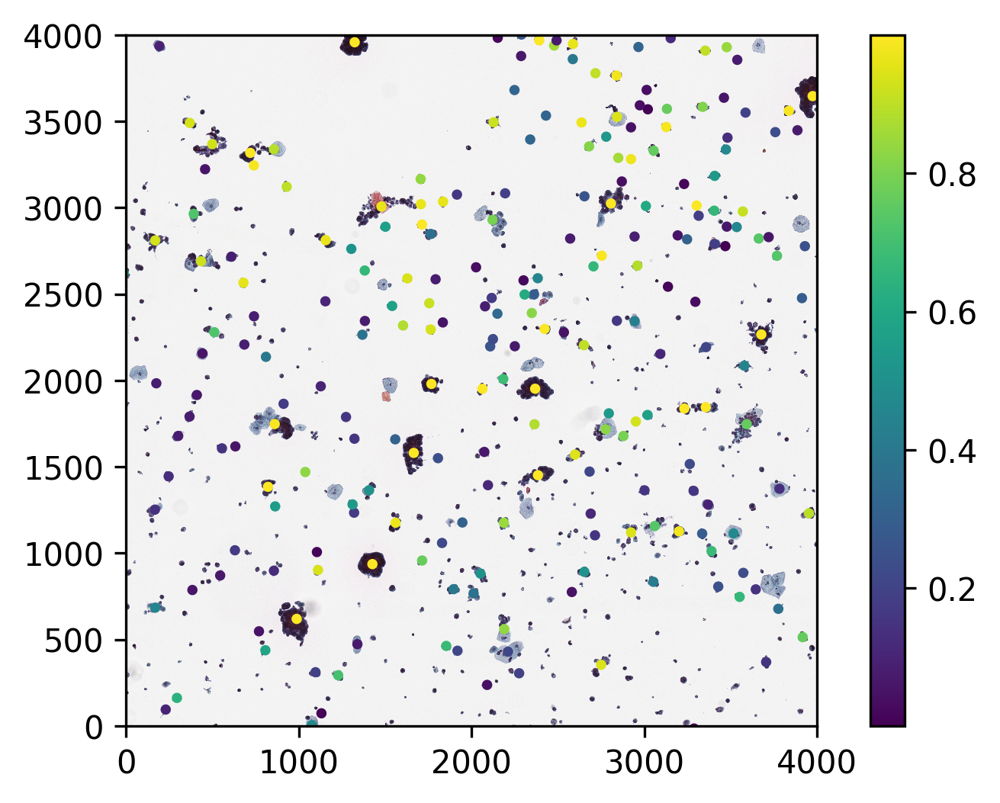

In [36]:
import matplotlib
matplotlib.rcParams['figure.dpi']=300
plt.imshow(arr[10000:14000,10000:14000])
plt.scatter(*(xy[:,::-1].T-10000).tolist(),s=5,c=stat['atypia'])
plt.xlim([0,4000])
plt.ylim([0,4000])
plt.colorbar()